# `2017 - 2022` Analysis

In [10]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from itertools import combinations
from collections import defaultdict

# Create functions

In [156]:
def calculate_mortality_procyear_table(df, hue_column, x_column, handle_nans='drop', fill_value=None, max_minutes=None, max_days=None):
    original_x_column = x_column
    
    # Handle NaN values
    if handle_nans == 'drop':
        df = df.dropna(subset=[hue_column, x_column, 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'])
    elif handle_nans == 'fill':
        df[hue_column] = df[hue_column].fillna(fill_value)
        df[x_column] = df[x_column].fillna(fill_value)
        df['EDDISCHARGEDISPOSITION'] = df['EDDISCHARGEDISPOSITION'].fillna('Unknown')
        df['HOSPDISCHARGEDISPOSITION'] = df['HOSPDISCHARGEDISPOSITION'].fillna('Unknown')
    
    mortality_procyear_table = pd.DataFrame(columns=['Mortality %', hue_column, x_column, '# of Cases'])
    
    # Determine the range of values in the x_column
    x_values = df[x_column].unique()
    
    for time in x_values:
        trauma_time_df = df.loc[df[x_column] == time]
        
        for category in trauma_time_df[hue_column].unique():
            category_df = trauma_time_df[trauma_time_df[hue_column] == category]
            if category_df.empty:
                continue
            
            expired_df1 = category_df[category_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
            expired_df2 = category_df[category_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
            mortality_p = ((len(expired_df1) + len(expired_df2)) / len(category_df)) * 100
            
            final_df = pd.DataFrame({
                'Mortality %': [mortality_p],
                hue_column: [category],
                x_column: [time],
                '# of Cases': [len(category_df)]
            })
            
            mortality_procyear_table = pd.concat([mortality_procyear_table, final_df], ignore_index=True)
    
    mortality_procyear_table['Mortality %'] = mortality_procyear_table['Mortality %'].astype(float)

    # Display the DataFrame
    display(mortality_procyear_table)

    # Plot the figure
    mpl.rcParams['figure.dpi'] = 1000
    sns.set_style('darkgrid', {"axes.facecolor": ".9"})
    sns.color_palette("viridis", as_cmap=True)
    
    plt.figure(figsize=(10, 6))
    g = sns.lineplot(data=mortality_procyear_table,
                     y='Mortality %',
                     x=x_column,
                     hue=hue_column,
                     palette='viridis',
                     marker='o')

    # Set x-tick labels to reflect the bin ranges if binned
    if x_column == f'{original_x_column} (binned)':
        g.set_xticklabels(bin_labels, rotation=45)

    plt.title(f'Mortality % by {original_x_column} for Different {hue_column} Codes')
    plt.xlabel(original_x_column)
    plt.ylabel('Mortality %')
    plt.legend(title=hue_column)
    plt.tight_layout()
    plt.show()
    
    return mortality_procyear_table

# Create dictionaries, file paths and desired columns of data fields

In [73]:
data_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/Data/Raw_data/PUF AY %i/CSV/'
years = range(2017, 2023)
thoracotomy_codes = ['0WJB0ZZ', '0WJ90ZZ', '02JA0ZZ', '02JY0ZZ', '0BJL0ZZ', '0BJK0ZZ', '0BJQ0ZZ','0WJ80ZZ', '0WJC0ZZ', '0WJD0ZZ', '02VW0CZ', '02QA0ZZ', '3E080GC']
sternotomy_codes = ['0P800ZZ']

mechanism_code_dict = {1:'Cut/pierce', 2:'Drowning/submersion', 3:'Fall', 4:'Fire/flame', 5:'Hot object/substance', 6:'Firearm', 7:'Machinery', 8:'MVT Occupant', 9:'MVT Motorcyclist', 10:'MVT Pedal cyclist', 11:'MVT Pedestrian', 12:'MVT Unspecified', 13:'MVT Other', 14:'Pedal cyclist, other', 15:'Pedestrian, other', 16:'Transport, other', 17:'Natural/environmental,  Bites and stings', 18:'Natural/environmental,  Other', 19:'Overexertion', 20:'Poisoning', 21:'Struck by, against', 22:'Suffocation', 23:'Other specified and classifiable', 24:'Other specified, not elsewhere classifiable', 25:'Unspecified', 26:'Adverse effects, medical care', 27:'Adverse effects, drugs'} # As noted in PUF dictionary
trauma_type_code_dict = {1:'Blunt', 2:'Penetrating', 3:'Burn', 4:'Other/unspecified', 9:'Activity Code - Not Valid as a Primary E-Code'} # As noted in PUF Dictionary
sex_code_dict = {1:'Male', 2:'Female', 3:'Unknown'}
eddischarge_code_dict = {1: 'Floor bed (general admission, non-specialty unit bed)', 2: 'Observation unit (unit that provides < 24 hour stays)', 3: 'Telemetry/step-down unit (less acuity than ICU)', 4: 'Home with services', 5: 'Deceased/expired', 6: 'Other (jail, institutional care, mental health, etc.)', 7: 'Operating Room', 8: 'Intensive Care Unit (ICU)', 9: 'Home without services', 10: 'Left against medical advice', 11: 'Transferred to another hospital'}
hospdischarge_disposition_code_dict = {1: 'Discharged/Transferred to a short-term general hospital for inpatient care', 2: 'Discharged/Transferred to an Intermediate Care Facility (ICF)', 3: 'Discharged/Transferred to home under care of organized home health service', 4: 'Left against medical advice or discontinued care', 5: 'Deceased/Expired', 6: 'Discharged to home or self-care (routine discharge)', 7: 'Discharged/Transferred to Skilled Nursing Facility (SNF)', 8: 'Discharged/Transferred to hospice care', 10: 'Discharged/Transferred to court/law enforcement', 11: 'Discharged/Transferred to inpatient rehab or designated unit', 12: 'Discharged/Transferred to Long Term Care Hospital (LTCH)', 13: 'Discharged/Transferred to a psychiatric hospital or psychiatric distinct part unit of a hospital', 14: 'Discharged/Transferred to another type of institution not defined elsewhere'}
deathined_code_dict = {1:'Arrived with NO signs of life', 2:'Arrived with signs of life'}
prehospca_code_dict = {1:'Yes', 2:'No'}
transport_mode_code_dict = {1:'Ground Ambulance', 2:'Helicopter Ambulance', 3:'Fixed-wing Ambulance', 4:'Private/Public Vehicle/Walk-in', 5:'Police', 6:'Other'}

cols17 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols19 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols17 = [x.upper() for x in cols17]
cols19 = [x.upper() for x in cols19]

common_cols = list(set(cols17) & set(cols19))

# Load in data and create a table for each year with all data fields in common from all years

In [74]:
for year in years:
    
    if year in range(2017, 2019):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    elif year in range(2019, 2023):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    else:
        pass
    
    TRAUMA_df.columns = map(str.upper, TRAUMA_df.columns)
    ICDPROCEDURE_df.columns = map(str.upper, ICDPROCEDURE_df.columns)
    ICDPROCEDURE_LOOKUP_df.columns = map(str.upper, ICDPROCEDURE_LOOKUP_df.columns)
    ECODE_LOOKUP_df.columns = map(str.upper, ECODE_LOOKUP_df.columns)
    
    if year in range(2019, 2023):
        ICDPROCEDURE_df['PROCEDUREMINS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTHRS']*60
        ICDPROCEDURE_df['PROCEDUREDAYS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTDAYS']
        TRAUMA_df['HMRRHGCTRLSURGMINS'] = TRAUMA_df['HMRRHGCTRLSURGHRS']*60
    else:
        pass
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[:, ['INC_KEY', 'ICDPROCEDURECODE', 'PROCEDUREMINS', 'PROCEDUREDAYS']]
    
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION', 'HMRRHGCTRLSURGMINS'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['HMRRHGCTRLSURGTYPE'] == 3.0]
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['INC_KEY'].isin(np.unique(TRAUMA_df['INC_KEY']))]
    
    ICDPROCEDURE_LOOKUP_df = ICDPROCEDURE_LOOKUP_df.loc[:, ['ICDPROCEDURECODE', 'ICDPROCEDURECODE_DESC']]
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    procedure_dict = dict(zip(ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE'], ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE_DESC'])) # create dictionary
    ICDPROCEDURE_df['ICDPROCEDURECODE'] = ICDPROCEDURE_df['ICDPROCEDURECODE'].replace(procedure_dict) # implement dictionary
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['INC_KEY'].isin(np.unique(ICDPROCEDURE_df['INC_KEY']))]
    
    ecode_dict = dict(zip(ECODE_LOOKUP_df['ECODE'], ECODE_LOOKUP_df['ECODE_DESC'])) # create dictionary
    TRAUMA_df['PRIMARYECODEICD10'] = TRAUMA_df['PRIMARYECODEICD10'].replace(ecode_dict) # implement dictionary
    
    mechanism_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['MECHANISM'])) # create dictionary
    TRAUMA_df['MECHANISM'] = TRAUMA_df['PRIMARYECODEICD10'].map(mechanism_dict) # implement dictionary
    
    traumatype_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['TRAUMATYPE'])) # create dictionary
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['PRIMARYECODEICD10'].map(traumatype_dict) # implement dictionary
    
    TRAUMA_df['MECHANISM'] = TRAUMA_df['MECHANISM'].replace(mechanism_code_dict) # implement dictionary
    
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['TRAUMATYPE'].replace(trauma_type_code_dict) # implement dictionary
    
    TRAUMA_df['SEX'] = TRAUMA_df['SEX'].replace(sex_code_dict)
    
    TRAUMA_df['EDDISCHARGEDISPOSITION'] = TRAUMA_df['EDDISCHARGEDISPOSITION'].replace(eddischarge_code_dict) # implement dictionary
    
    TRAUMA_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_df['HOSPDISCHARGEDISPOSITION'].replace(hospdischarge_disposition_code_dict) # implement dictionary
    
    TRAUMA_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newTRAUMA_df_%i.csv'%year, index=False)
    ICDPROCEDURE_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newICDPROCEDURE_df_%i.csv'%year, index=False)
    
    display(ICDPROCEDURE_df.head())
    display(TRAUMA_df.head())
    
    # Free up memory
    del TRAUMA_df, ICDPROCEDURE_df, ICDPROCEDURE_LOOKUP_df, ECODE_LOOKUP_df

,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1050,170002937445,"Insertion of Endotracheal Airway into Trachea,...",8.0,1.0
4010,170000021215,Drainage of Right Pleural Cavity with Drainage...,NaN,NaN
4011,170000021215,Drainage of Left Pleural Cavity with Drainage ...,NaN,NaN
4012,170000021215,"Drainage of Right Inguinal Region, Open Approach",NaN,NaN
4013,170000021215,"Performance of Cardiac Output, Continuous",NaN,NaN


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
251,NaN,1.0,2.0,NaN,NaN,1.0,33.0,0,0,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating
835,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Cut/pierce,Penetrating
1412,NaN,1.0,2.0,NaN,NaN,1.0,31.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating
1489,NaN,1.0,2.0,NaN,W74.XXXA,NaN,24.0,0,1,0,...,0,NaN,NaN,NaN,2.0,2.0,NaN,2017.0,Firearm,Penetrating
1825,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2363,180023610118,Ultrasonography of Abdomen,0.0,1.0
2364,180023610118,"Insertion of Endotracheal Airway into Trachea,...",6.0,1.0
2366,180023610118,Drainage of Right Pleural Cavity with Drainage...,10.0,1.0
2367,180023610118,"Inspection of Right Pleural Cavity, Open Approach",29.0,1.0
2368,180023610118,"Repair Heart, Open Approach",29.0,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
301,NaN,1.0,2.0,NaN,NaN,1.0,20.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,Firearm,Penetrating
1819,NaN,1.0,2.0,NaN,Y07.04,NaN,27.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,Cut/pierce,Penetrating
2118,NaN,1.0,2.0,NaN,NaN,1.0,35.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,Firearm,Penetrating
3020,NaN,1.0,2.0,NaN,NaN,1.0,22.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating
3257,NaN,1.0,2.0,NaN,NaN,1.0,71.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
1181,190027760890,Plain Radiography of Chest,1.8,1.0
1309,190027760890,Computerized Tomography (CT Scan) of Facial Bones,24.0,1.0
1311,190027760890,Ultrasonography of Abdomen,4.2,1.0
1313,190027760890,Insertion of Infusion Device into Right Radial...,49.8,1.0
1316,190027760890,Drainage of Right Pleural Cavity with Drainage...,64.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
156,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
173,NaN,1.0,2.0,NaN,NaN,1.0,29.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
192,NaN,1.0,2.0,NaN,NaN,1.0,60.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating
1042,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
3316,NaN,1.0,2.0,NaN,NaN,1.0,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
2551,200042924891,NaN,NaN,NaN
10107,200043189429,Insertion of Monitoring Device into Upper Arte...,22.2,1.0
10108,200043189429,Insertion of Infusion Device into Right Subcla...,1561.2,2.0
10109,200043189429,"Excision of Left Lung, Open Approach",343.8,1.0
10110,200043189429,"Insertion of Endotracheal Airway into Trachea,...",142.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
504,NaN,NaN,NaN,NaN,NaN,NaN,23.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1459,NaN,NaN,NaN,NaN,NaN,NaN,89.0,1,0,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Occupant,Blunt
2010,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
3111,NaN,NaN,NaN,NaN,NaN,NaN,31.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Motorcyclist,Blunt
3214,NaN,NaN,NaN,NaN,NaN,NaN,37.0,0,0,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Occupant,Blunt


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
3282,210057699044,"Restriction of Thoracic Aorta, Descending with...",771.0,2.0
3283,210057699044,Insertion of Intraluminal Device into Right Ra...,625.8,2.0
3284,210057699044,"Repair Right Upper Eyelid, External Approach",NaN,2.0
3285,210057699044,"Repair Face Skin, External Approach",NaN,2.0
3286,210057699044,"Repair Face Skin, External Approach",NaN,2.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
414,NaN,NaN,NaN,NaN,NaN,NaN,21.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Occupant,Blunt
562,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Other specified and classifiable,Blunt
1243,NaN,NaN,NaN,NaN,NaN,NaN,20.0,0,0,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Occupant,Blunt
1695,NaN,NaN,NaN,NaN,NaN,NaN,29.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1714,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
4686,220063640246,"Insertion of Endotracheal Airway into Trachea,...",3.0,1.0
4687,220063640246,Drainage of Right Pleural Cavity with Drainage...,4.2,1.0
4688,220063640246,Drainage of Left Pleural Cavity with Drainage ...,4.8,1.0
4689,220063640246,"Inspection of Right Pleural Cavity, Open Approach",4.8,1.0
4690,220063640246,"Inspection of Left Pleural Cavity, Open Approach",4.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
736,NaN,NaN,NaN,NaN,NaN,NaN,58.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
783,NaN,NaN,NaN,NaN,NaN,NaN,79.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Pedestrian,Blunt
1392,NaN,NaN,NaN,NaN,NaN,NaN,76.0,0,0,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Occupant,Blunt
1685,NaN,NaN,NaN,NaN,NaN,NaN,27.0,0,0,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1752,NaN,NaN,NaN,NaN,NaN,NaN,22.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


# Data Exploration of Thoracotomy Data Population

## Combine years of data into one `DataFrame` for figure generation

In [127]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newICDPROCEDURE_df_%i.csv'

years = range(2017, 2023)

# Preload column names
TRAUMA_cols = pd.read_csv(TRAUMA_fp % 2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp % 2017, nrows=1).columns.tolist()

# Collect DataFrames in lists
trauma_dfs = []
icdprocedure_dfs = []

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp % year, usecols=TRAUMA_cols)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp % year, usecols=ICDPROCEDURE_cols)
    icdprocedure_df['Year'] = year
    trauma_dfs.append(trauma_df)
    icdprocedure_dfs.append(icdprocedure_df)

# Concatenate DataFrames once at the end
TRAUMA_all_df = pd.concat(trauma_dfs, ignore_index=True)
ICDPROCEDURE_all_df = pd.concat(icdprocedure_dfs, ignore_index=True)

TRAUMA_all_df['SEX'] = TRAUMA_all_df['SEX'].replace({'3.0': 'Unknown', 'Not Known BIU 2': 'Unknown', 'Not Known/Not Recorded BIU 2': 'Unknown', 'Unknown': 'Unknown'})
TRAUMA_all_df['DEATHINED'] = TRAUMA_all_df['DEATHINED'].replace(deathined_code_dict)
TRAUMA_all_df['TRANSPORTMODE'] = TRAUMA_all_df['TRANSPORTMODE'].replace(transport_mode_code_dict)
TRAUMA_all_df['PREHOSPITALCARDIACARREST'] = TRAUMA_all_df['PREHOSPITALCARDIACARREST'].replace(prehospca_code_dict)
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['HMRRHGCTRLSURGMINS'])
TRAUMA_all_df['HMRRHGCTRLSURGMINS'] = TRAUMA_all_df['HMRRHGCTRLSURGMINS'].round().astype(int)
TRAUMA_all_df = TRAUMA_all_df.loc[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 60) & (TRAUMA_all_df['HMRRHGCTRLSURGDAYS'] <= 1.0)]
ICDPROCEDURE_all_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'].isin(np.unique(TRAUMA_all_df['INC_KEY']))]

# Display results
display(TRAUMA_all_df.tail())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.tail())
print(np.shape(ICDPROCEDURE_all_df))

# Free up memory
del trauma_dfs, icdprocedure_dfs


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE,Year
17586,NaN,NaN,NaN,NaN,NaN,NaN,17.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating,2022
17587,NaN,NaN,NaN,NaN,NaN,NaN,39.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating,2022
17588,NaN,NaN,NaN,NaN,NaN,NaN,55.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating,2022
17589,NaN,NaN,NaN,NaN,NaN,NaN,41.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating,2022
17590,NaN,NaN,NaN,NaN,NaN,NaN,35.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating,2022


(12674, 333)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
274140,220072330368,Transfusion of Nonautologous Red Blood Cells i...,7.2,1.0,2022
274141,220072330368,Introduction of Other Therapeutic Substance in...,0.0,1.0,2022
274142,220072330368,"Performance of Cardiac Output, Single, Manual",0.0,1.0,2022
274143,220072330368,"Respiratory Ventilation, Less than 24 Consecut...",3.0,1.0,2022
274144,220072330368,Ultrasonography of Abdomen,0.0,1.0,2022


(179359, 5)


## Age Demographics

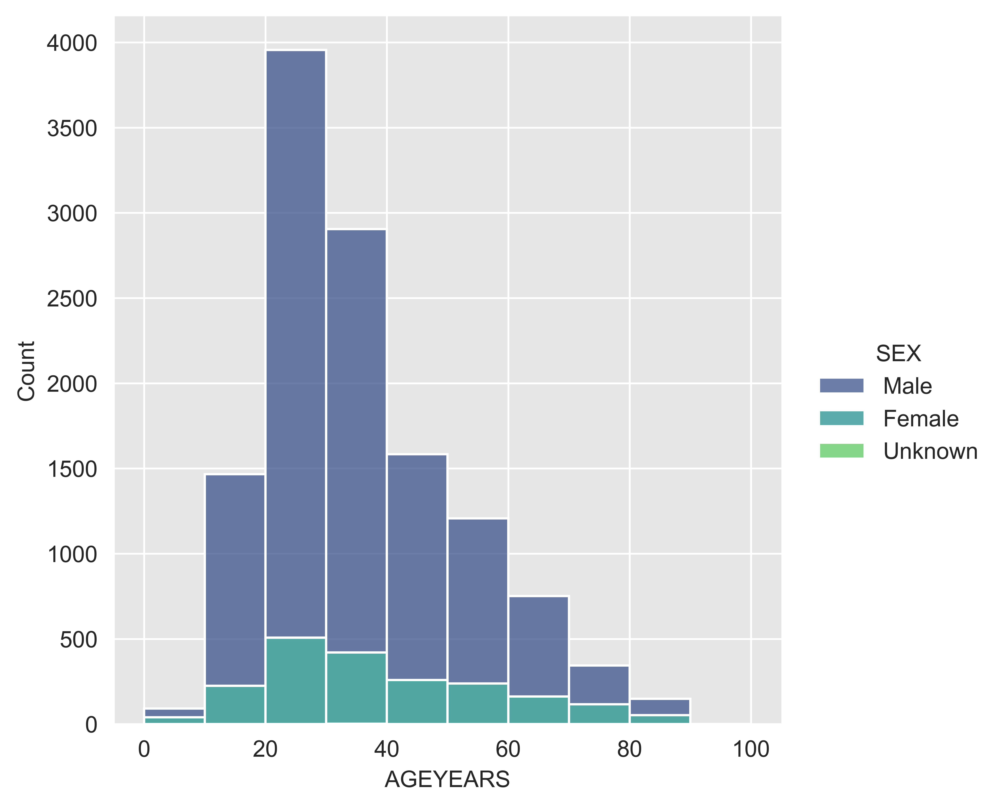

In [76]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='SEX',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

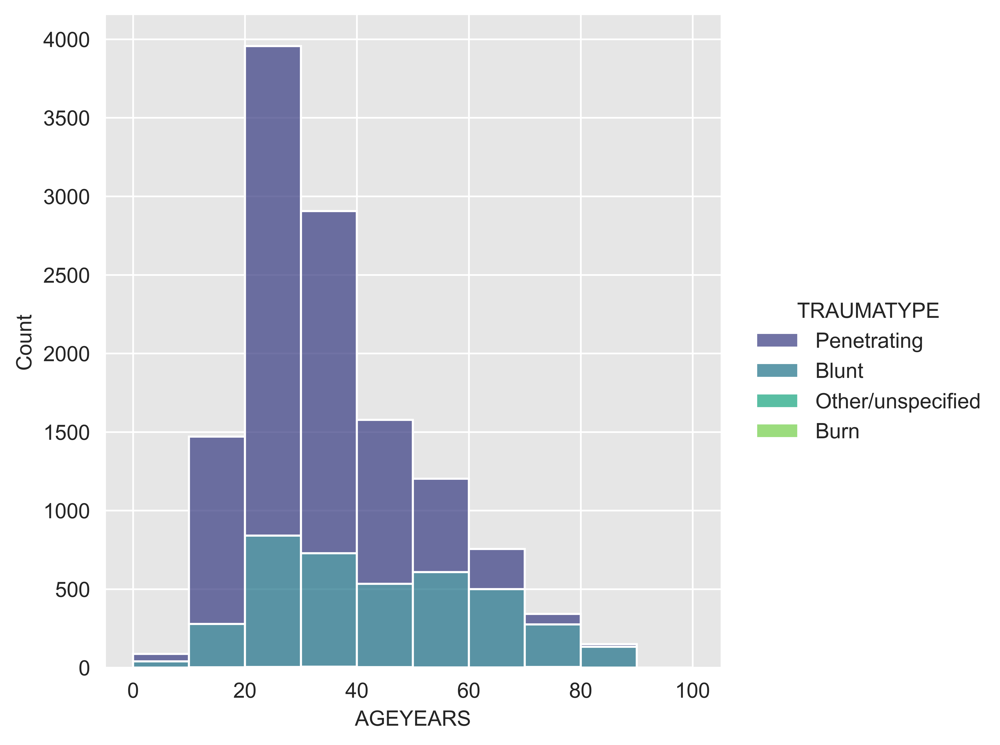

In [77]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='TRAUMATYPE',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

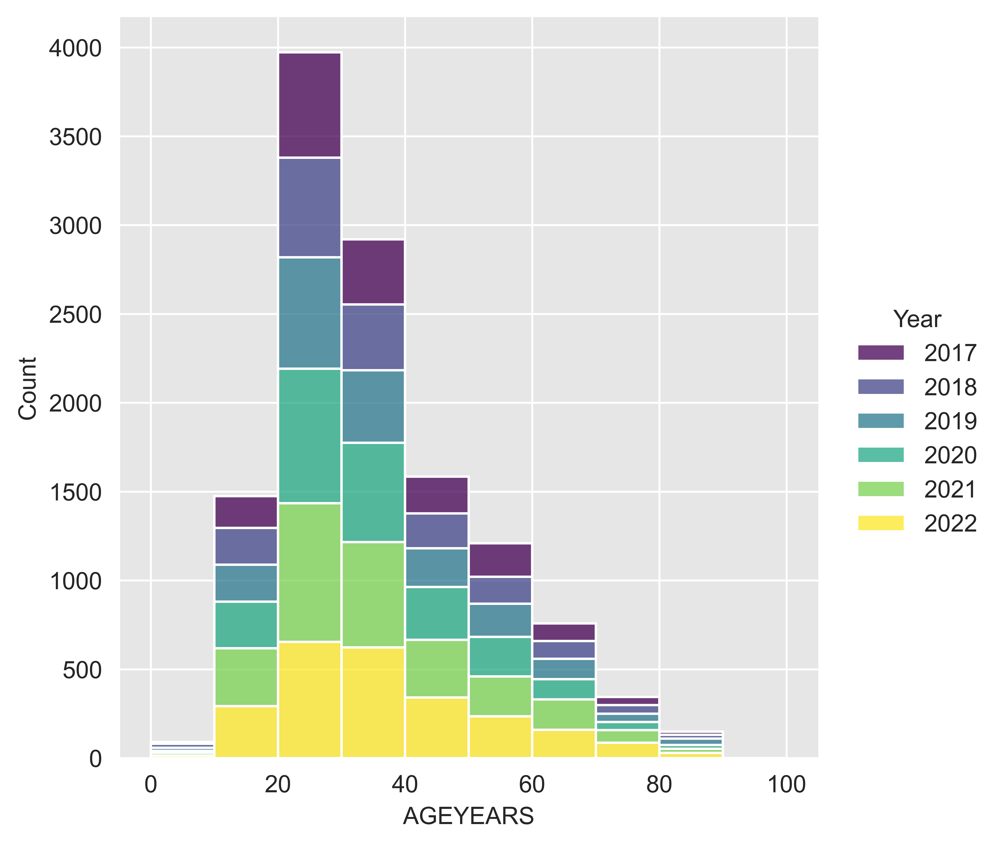

In [78]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='Year',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

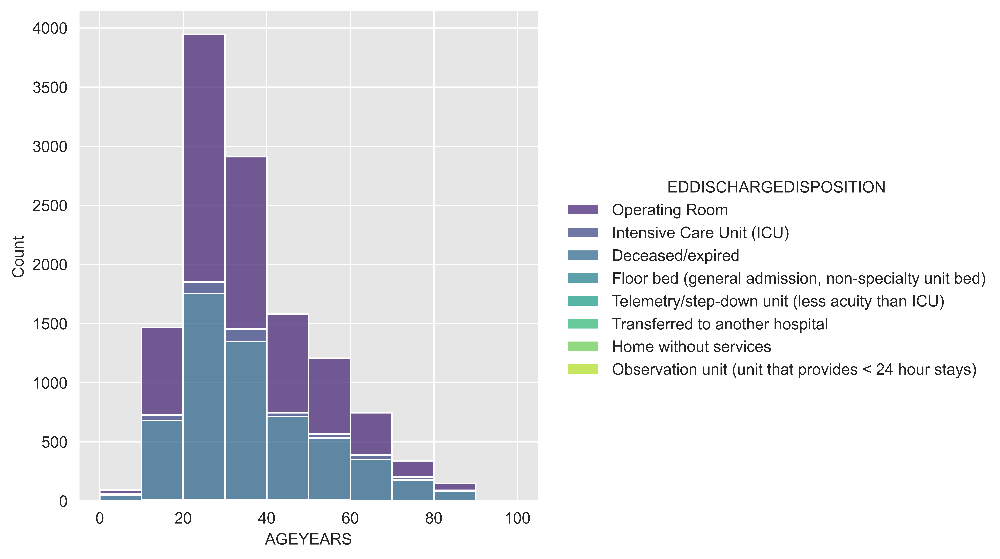

In [87]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='EDDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

In [88]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='HOSPDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

# Data about ICD Procedures (Includes **ALL** Procedures, not just the thoracomies but is only using thoracotomy patients)

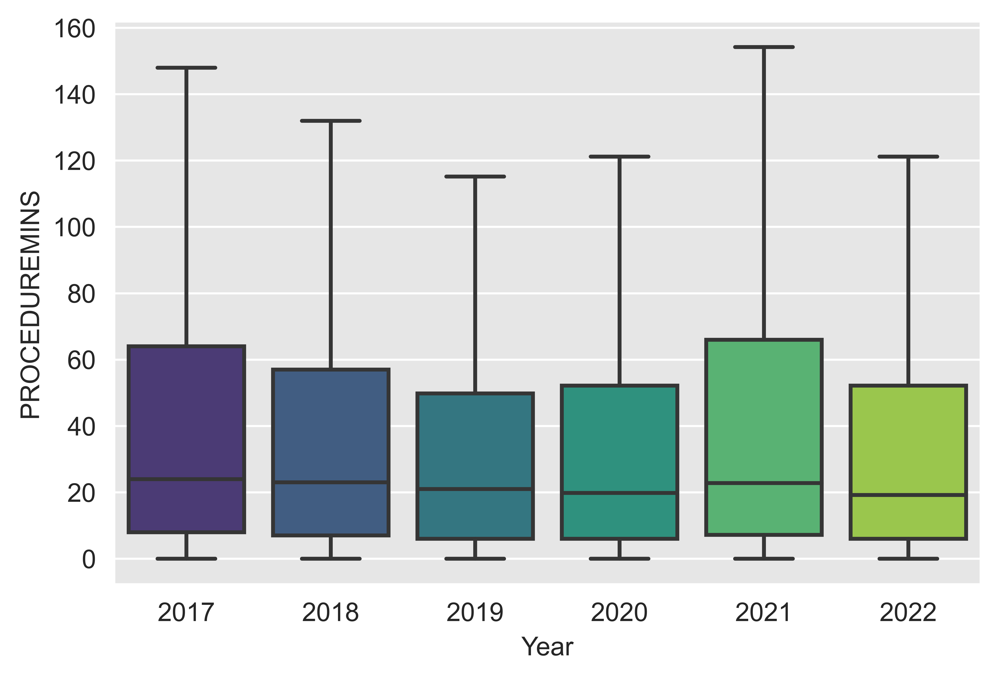

In [89]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

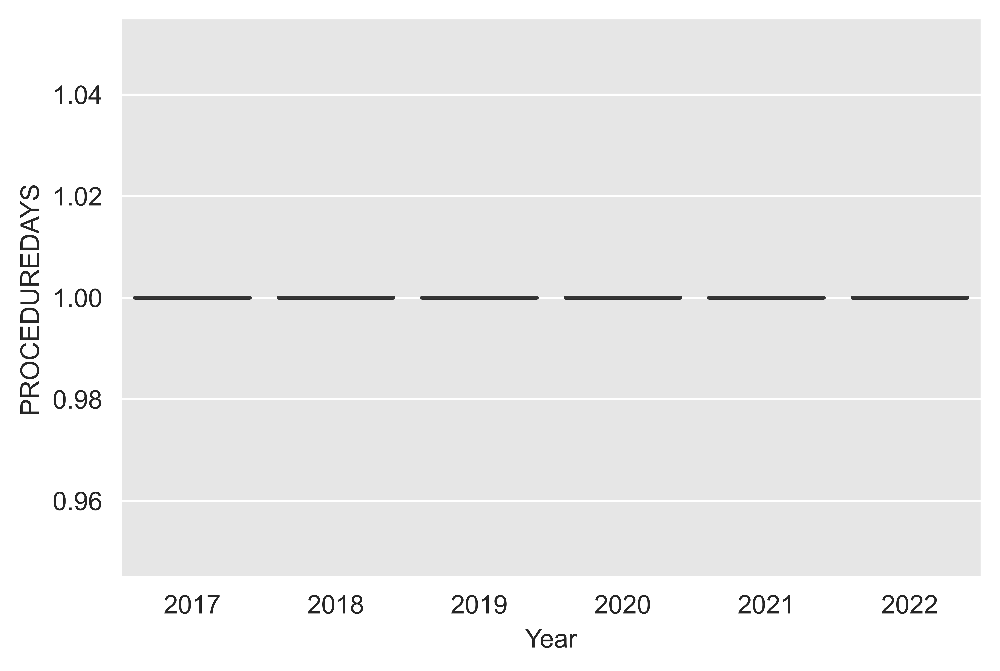

In [90]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

> If you include outliers from previous figure there are a numerous patients that underwent procedures outside of the first day, however, **ALL** of these are considered outliers in the data (i.e. surviving past the first day makes you an outlier)

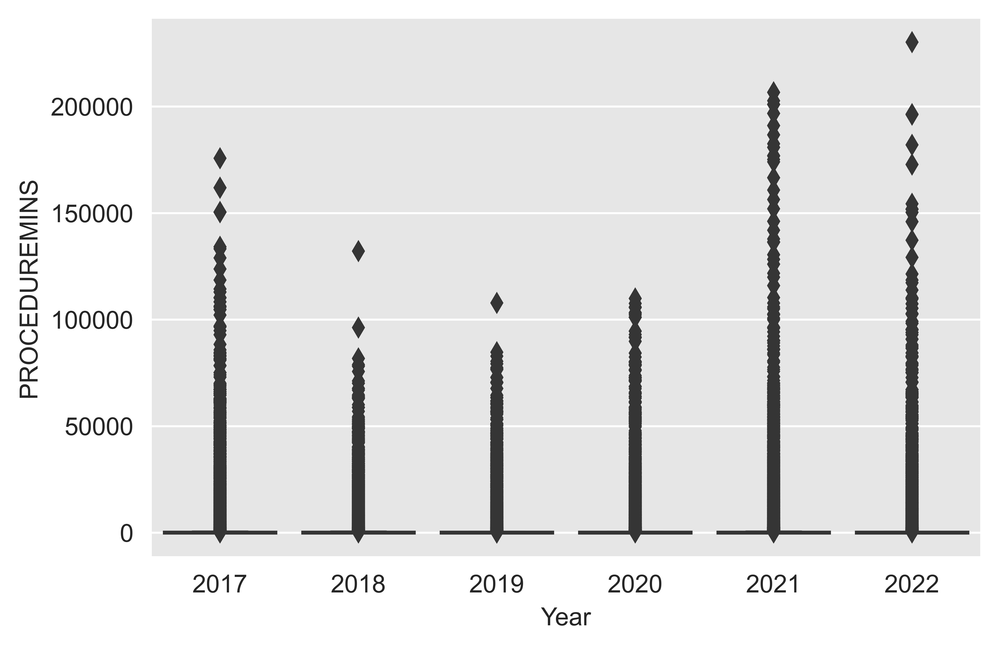

In [91]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

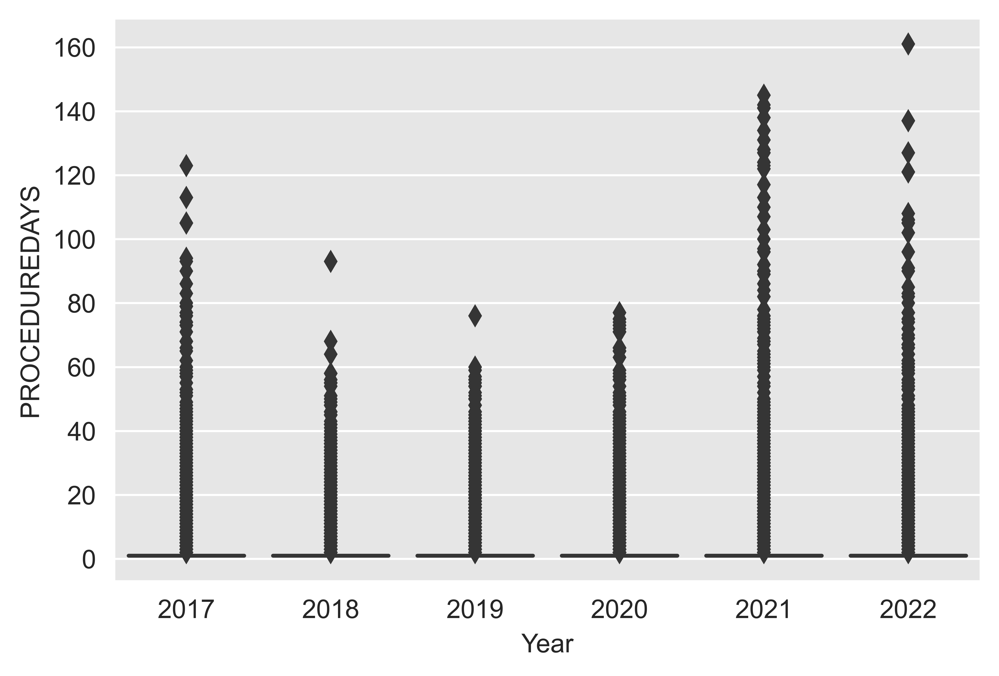

In [92]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

# Thoracotomy Patients, Only Looking at Procedures We Deemed Directly Thoracotomy Related

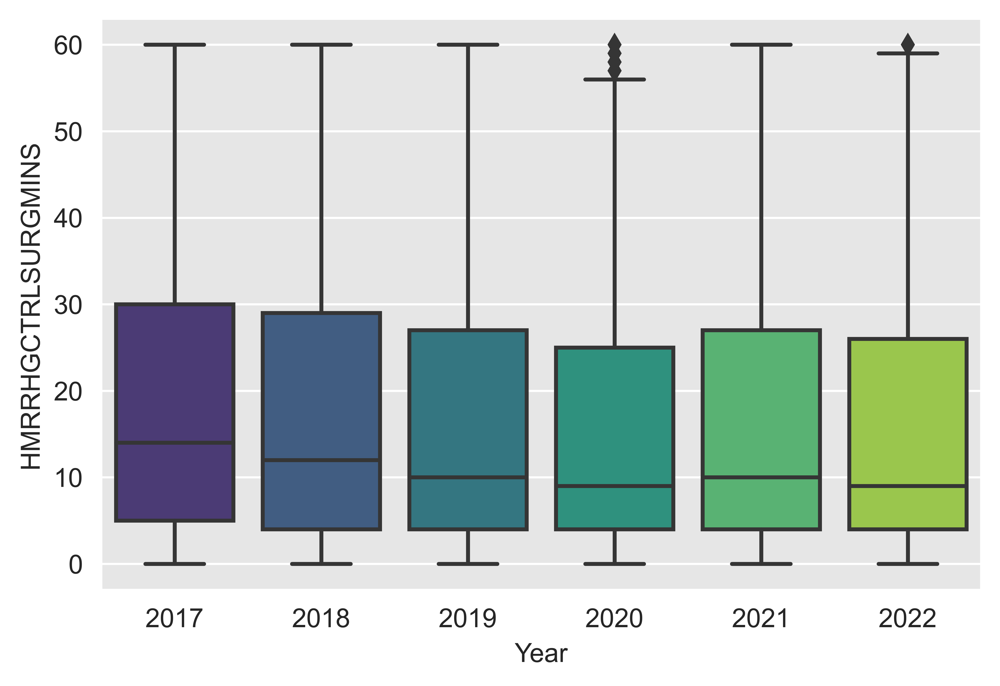

In [93]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGMINS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

> The below figure is obviously uninteresting but validates that the filtering protocols in previous steps at the very least limited the procedures to the thoracotomies performed on the same day as arrival to the ED.

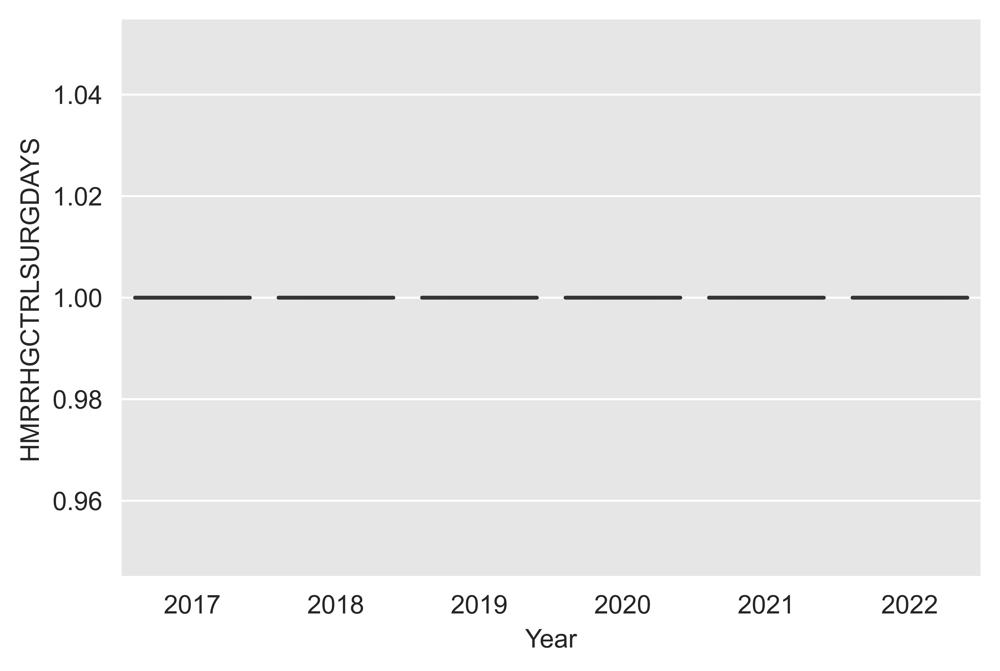

In [94]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=TRAUMA_all_df,
               y='HMRRHGCTRLSURGDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

# Within 60 minutes of arrival

In [110]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
years = range(2017, 2023) # set to year 2016 for max with this part of pipeline
for year in years:
    year_df = TRAUMA_all_df[TRAUMA_all_df['Year'] == year]
    penetrating_df = year_df[year_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = year_df[year_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', np.shape(penetrating_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', np.shape(blunt_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    mortality_year_table = pd.concat([mortality_year_table, combined_df])
mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table)

,Year,Mortality %,MOI,Thoracotomies Performed (Year Total for All MOI)
0,2017,73.244147,Penetrating,1196
1,2017,90.566038,Blunt,530
0,2018,76.830319,Penetrating,1161
1,2018,89.035917,Blunt,529
0,2019,76.094003,Penetrating,1234
1,2019,92.056075,Blunt,642
0,2020,79.156627,Penetrating,1660
1,2020,91.277259,Blunt,642
0,2021,77.010193,Penetrating,1766
1,2021,91.773779,Blunt,778


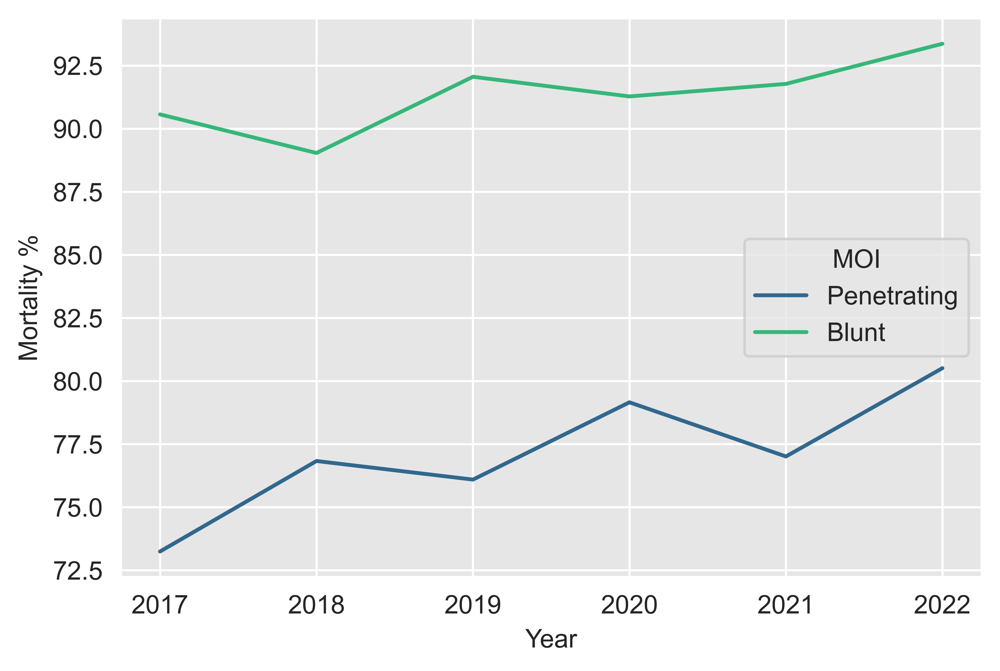

In [111]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis')
tick_labels = np.arange(mortality_year_table['Year'].min(), mortality_year_table['Year'].max() + 1)
g.set_xticks(tick_labels)
g.set_xticklabels(tick_labels.astype(int))
plt.show()

# Within 20 minutes of arrival

In [112]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
years = range(2017, 2023) # set to year 2016 for max with this part of pipeline
for year in years:
    year_df = TRAUMA_all_df[TRAUMA_all_df['Year'] == year]
    year_df = year_df[year_df['HMRRHGCTRLSURGMINS'] <= 20.0]
    penetrating_df = year_df[year_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = year_df[year_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', np.shape(penetrating_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', np.shape(blunt_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    mortality_year_table = pd.concat([mortality_year_table, combined_df])
mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table)

,Year,Mortality %,MOI,Thoracotomies Performed (Year Total for All MOI)
0,2017,87.907609,Penetrating,736
1,2017,93.846154,Blunt,325
0,2018,92.042440,Penetrating,754
1,2018,92.834891,Blunt,321
0,2019,89.671932,Penetrating,823
1,2019,94.786730,Blunt,422
0,2020,91.206897,Penetrating,1160
1,2020,93.911007,Blunt,427
0,2021,90.677966,Penetrating,1180
1,2021,93.904762,Blunt,525


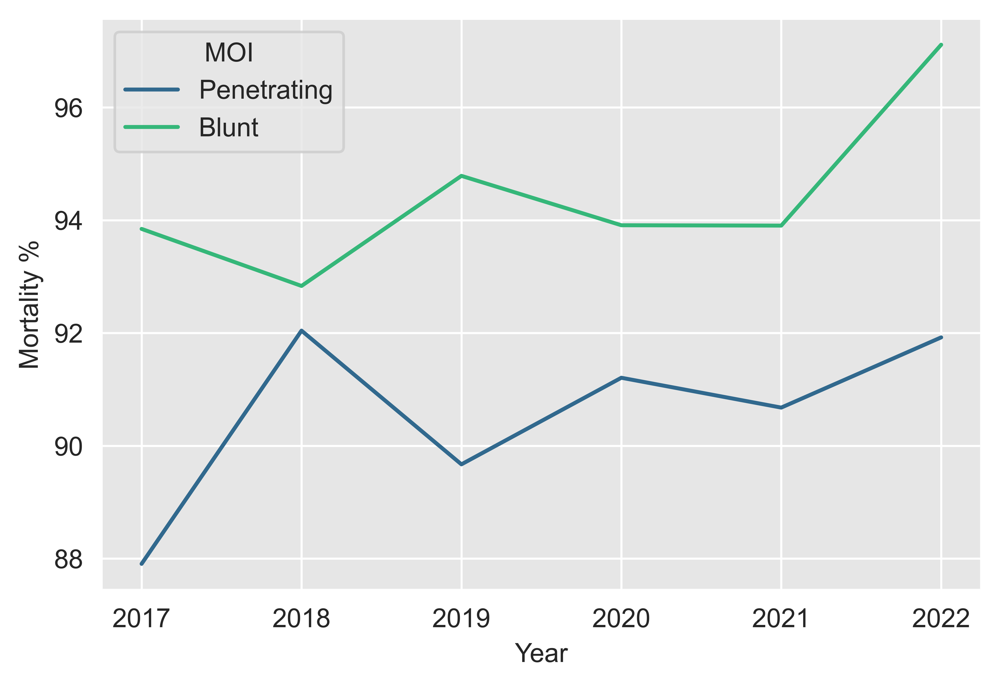

In [113]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis')
tick_labels = np.arange(mortality_year_table['Year'].min(), mortality_year_table['Year'].max() + 1)
g.set_xticks(tick_labels)
g.set_xticklabels(tick_labels.astype(int))
plt.show()

# Within 10 minutes of arrival

In [114]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
years = range(2017, 2023) # set to year 2016 for max with this part of pipeline
for year in years:
    year_df = TRAUMA_all_df[TRAUMA_all_df['Year'] == year]
    year_df = year_df[year_df['HMRRHGCTRLSURGMINS'] <= 10.0]
    penetrating_df = year_df[year_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = year_df[year_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', np.shape(penetrating_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', np.shape(blunt_df)[0]]], columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Year', 'Mortality %', 'MOI', 'Thoracotomies Performed (Year Total for All MOI)'])
    mortality_year_table = pd.concat([mortality_year_table, combined_df])
mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table)

,Year,Mortality %,MOI,Thoracotomies Performed (Year Total for All MOI)
0,2017,93.418647,Penetrating,547
1,2017,95.348837,Blunt,215
0,2018,94.117647,Penetrating,578
1,2018,94.323144,Blunt,229
0,2019,93.887147,Penetrating,638
1,2019,96.732026,Blunt,306
0,2020,95.033113,Penetrating,906
1,2020,96.393443,Blunt,305
0,2021,94.791667,Penetrating,960
1,2021,95.894428,Blunt,341


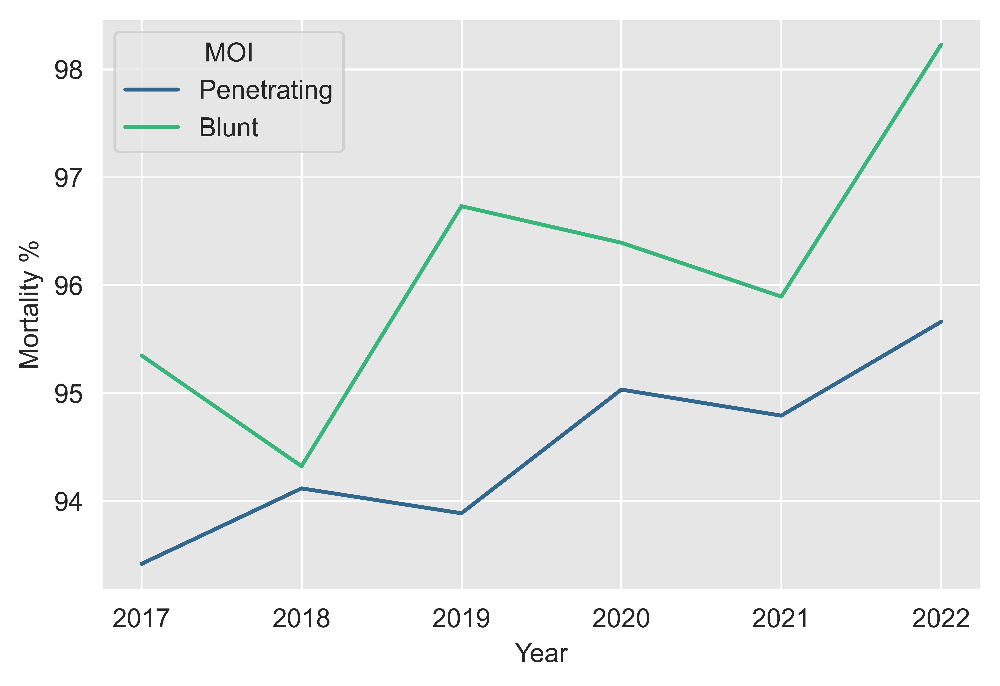

In [115]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis')
tick_labels = np.arange(mortality_year_table['Year'].min(), mortality_year_table['Year'].max() + 1)
g.set_xticks(tick_labels)
g.set_xticklabels(tick_labels.astype(int))
plt.show()

## Create `DataFrame` of Mortality by `Age` and `Trauma Type`

In [176]:
mortality_age_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)

for age_range in age_ranges:
    age_range_df = TRAUMA_all_df[(TRAUMA_all_df['AGEYEARS'] > age_range+1) & (TRAUMA_all_df['AGEYEARS'] <= age_range+10)]
    age_range_df = age_range_df[age_range_df['HMRRHGCTRLSURGMINS'] =]
    penetrating_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_blunt_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
    mortality_age_table = pd.concat([mortality_age_table, combined_df])
mortality_age_table['Mortality %'] = mortality_age_table['Mortality %'].astype(float)
mortality_age_table['Age Range'] = mortality_age_table['Age Range'].astype(str)
display(mortality_age_table)

ZeroDivisionError: division by zero

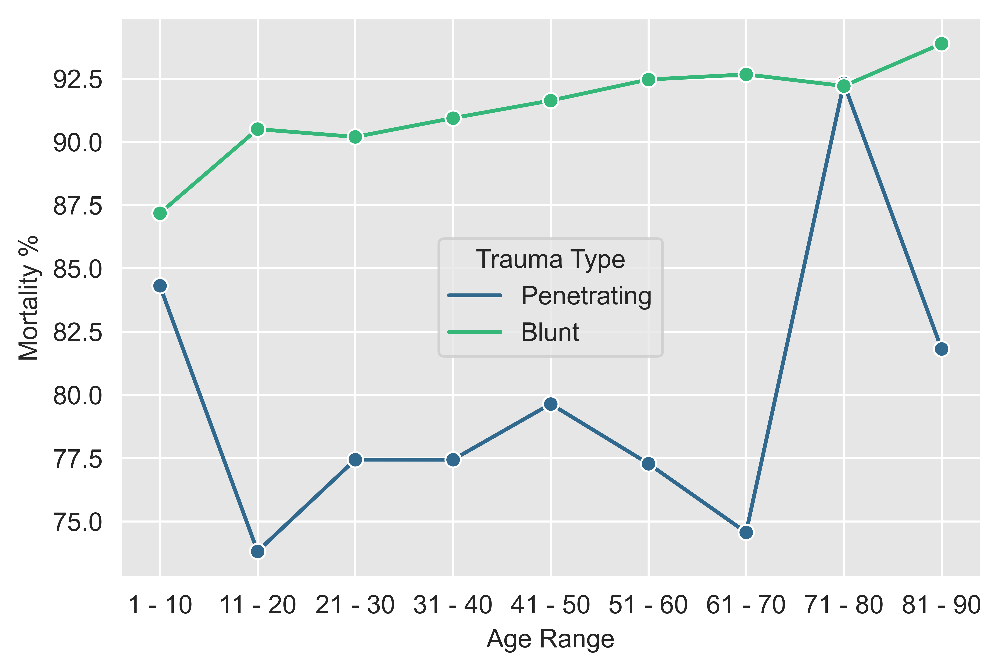

In [175]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_age_table,
               y='Mortality %',
               x='Age Range',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

## Create `DataFrame` of Mortality by `PROCEDUREMINS` and `Trauma Type`

In [168]:
proc_times = range(0, 21, 1)
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
for time in proc_times:
    trauma_time_df = TRAUMA_all_df.loc[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] == time]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table)

,Mortality %,Trauma Type,Procedure Time (Minutes after ED Arrival),# of Cases
0,95.512821,Penetrating,0,468
1,97.297297,Blunt,0,111
0,97.772829,Penetrating,1,449
1,95.901639,Blunt,1,122
0,96.759941,Penetrating,2,679
1,97.727273,Blunt,2,220
0,97.019868,Penetrating,3,604
1,98.412698,Blunt,3,252
0,95.957821,Penetrating,4,569
1,98.029557,Blunt,4,203


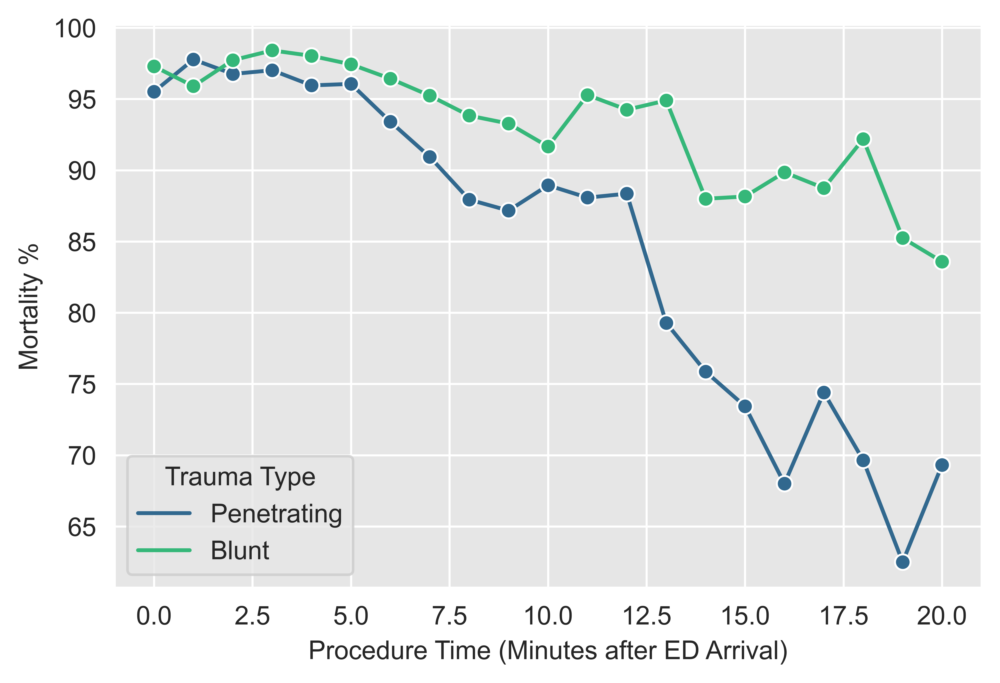

In [169]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

> Unfortunately, my function does not seem to be generating the same results for x variables other than **Year**. It must be the way it is being calculated because the number of results are not the same between the two tables or scenarios. Will have to figure out which method is incorrect. For now, I will stick with the same method as the other branch that is going off of ICD10 codes.

In [171]:
proc_times = range(0, 11, 1)
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
for time in proc_times:
    trauma_time_df = TRAUMA_all_df.loc[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] == time]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table)

,Mortality %,Trauma Type,Procedure Time (Minutes after ED Arrival),# of Cases
0,95.512821,Penetrating,0,468
1,97.297297,Blunt,0,111
0,97.772829,Penetrating,1,449
1,95.901639,Blunt,1,122
0,96.759941,Penetrating,2,679
1,97.727273,Blunt,2,220
0,97.019868,Penetrating,3,604
1,98.412698,Blunt,3,252
0,95.957821,Penetrating,4,569
1,98.029557,Blunt,4,203


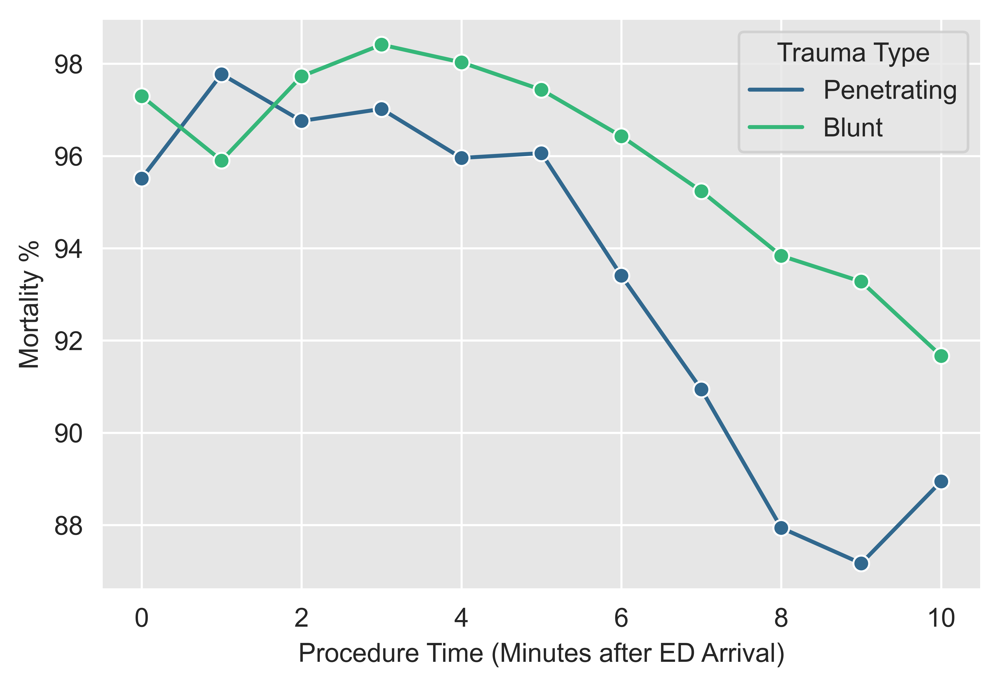

In [172]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

# Now let's investigate some other stuff

> **From this point forward, we will simply include thoracotomies performed in the first 20 minutes as we now get the idea that this makes a big difference in the accuracy of the data.** 

> The `Loyola` paper used 15 minutes as a cutoff, Dr. Schlanser recommended a cutoff of 15-20 minutes. We can go back and forth about the exact time cutoff for the data but this is comparable regardless. Based on previous data and the above time series data, I would not be opposed to being more aggressive and even going for a 10 minute cutoff.

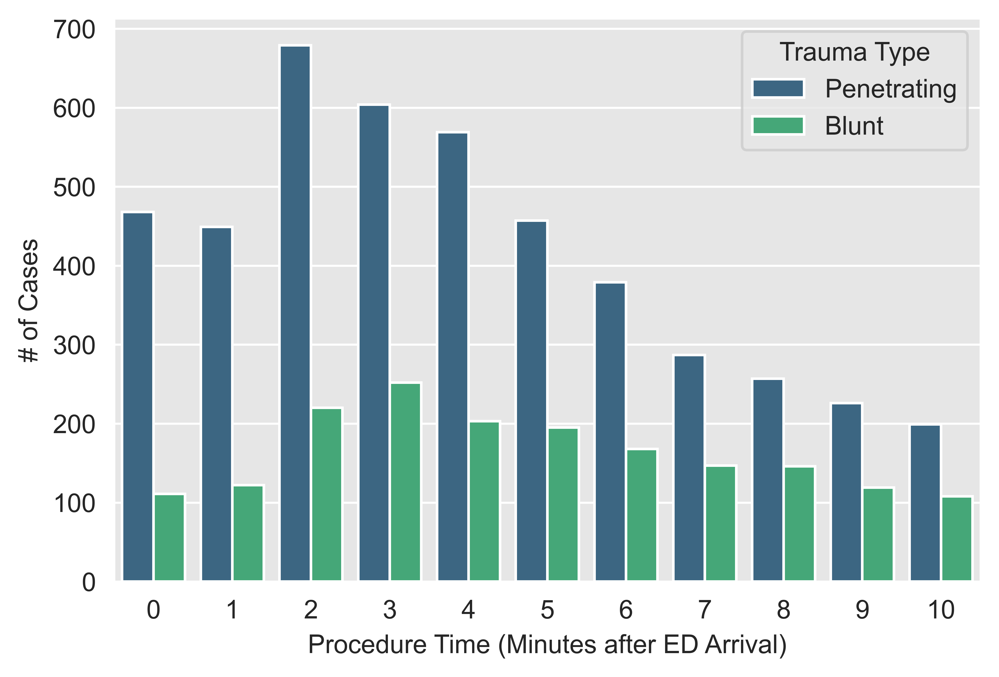

In [173]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.barplot(data=mortality_proctime_table, x='Procedure Time (Minutes after ED Arrival)', y='# of Cases', hue='Trauma Type', palette='viridis')
plt.show()

> Based on the above barplot, it is reasonable to say that the vast majority of cases occur within the first 15 minutes, if not the first 10 minutes. This supports the idea noted above that we could even go for a more aggressive cutoff.